## Importing Modules


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import random
import tqdm
from tensorflow.keras.utils import load_img

warnings.filterwarnings("ignore")

## Creating Dataframe for Input and Output


In [3]:
input_path = []
label = []

# Collecting all the data and labelling Cat as 0 and Dog as 1
for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))

In [4]:
# Creating dataframe for the data
df = pd.DataFrame()
df['Images'] = input_path
df['Label'] = label
df = df.sample(frac=1).reset_index(drop=True)  # Shuffling the data
df.head()

,Images,Label
0,PetImages\Dog\1615.jpg,1
1,PetImages\Cat\9465.jpg,0
2,PetImages\Cat\3416.jpg,0
3,PetImages\Dog\11235.jpg,1
4,PetImages\Cat\4009.jpg,0


## Exploratory Data Analysis


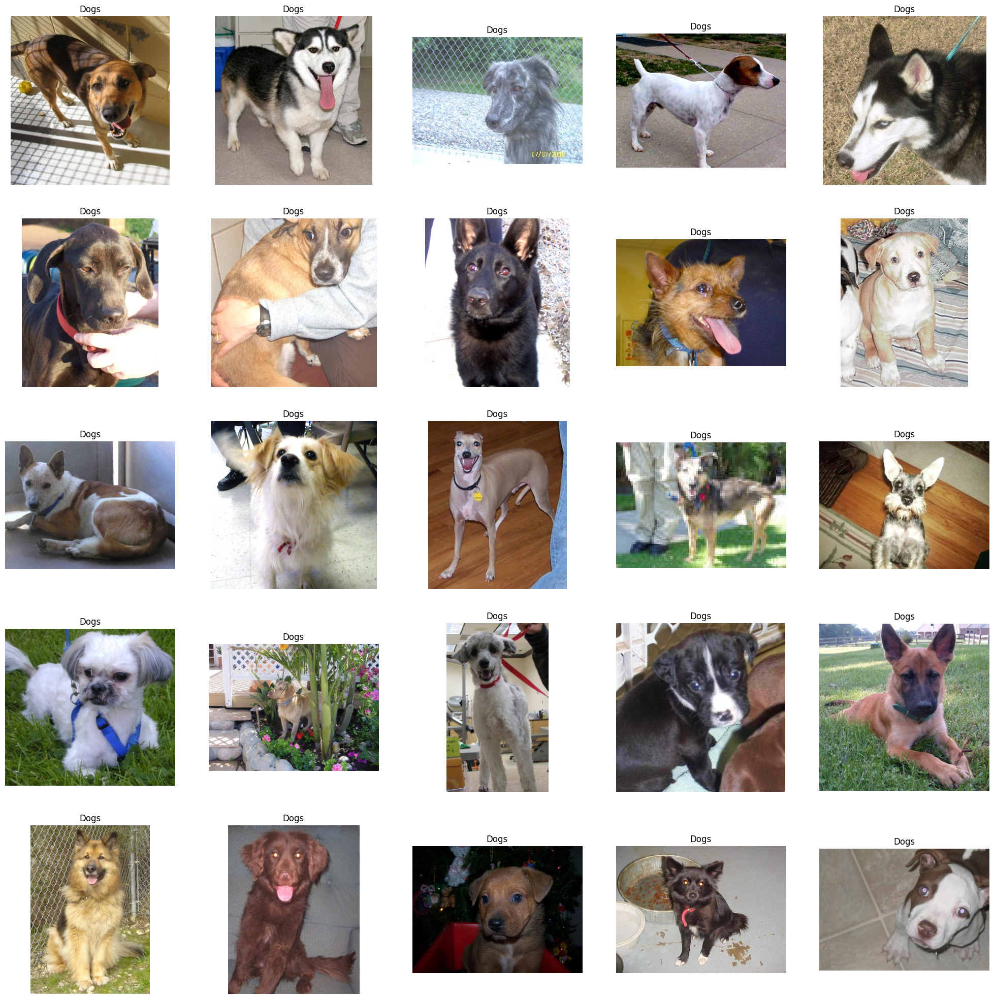

In [5]:
# to display grid of images for dogs
plt.figure(figsize=(25, 25))
temp = df[df['Label'] == 1]['Images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5, 5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

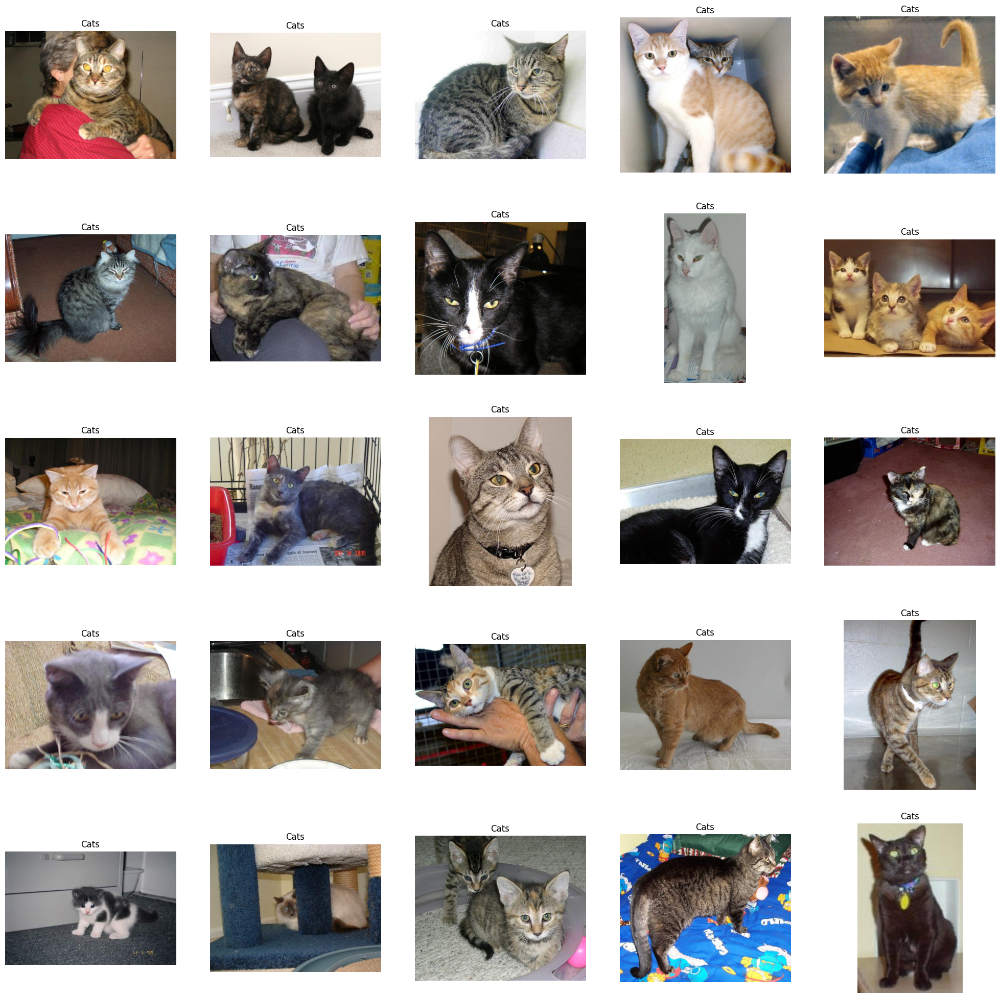

In [6]:
# to display grid of images for cats
plt.figure(figsize=(25, 25))
temp = df[df['Label'] == 0]['Images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5, 5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

## Create Data Generators for the Images


In [8]:
df['Label']=df['Label'].astype('str')

In [9]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df,test_size=0.2, random_state=42)

In [10]:
from keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale=1.0 / 255,  # normalization of images
    rotation_range=40,  # augmentation of images to avoid over fitting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest",
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='Images',
    y_col='Label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='Images',
    y_col='Label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19996 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [11]:
from keras import Sequential
from keras.layers import Conv2D,MaxPool2D,Flatten,Dense

model = Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])


In [12]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [13]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 447s 11s/step - loss: 0.6870 - accuracy: 0.5706 - val_loss: 0.6467 - val_accuracy: 0.6292
Epoch 2/10
40/40 [==============================] - 383s 9s/step - loss: 0.6348 - accuracy: 0.6533 - val_loss: 0.5773 - val_accuracy: 0.7100
Epoch 3/10
40/40 [==============================] - 337s 8s/step - loss: 0.5776 - accuracy: 0.6994 - val_loss: 0.5434 - val_accuracy: 0.7328
Epoch 4/10
40/40 [==============================] - 334s 8s/step - loss: 0.5536 - accuracy: 0.7177 - val_loss: 0.5245 - val_accuracy: 0.7394
Epoch 5/10
40/40 [==============================] - 280s 7s/step - loss: 0.5600 - accuracy: 0.7119 - val_loss: 0.5083 - val_accuracy: 0.7454
Epoch 6/10
40/40 [==============================] - 201s 5s/step - loss: 0.5123 - accuracy: 0.7491 - val_loss: 0.4722 - val_accuracy: 0.7698
Epoch 7/10
40/40 [==============================] - 225s 6s/step - loss: 0.5036 - accuracy: 0.7544 - val_loss: 0.4667 - val_accuracy: 0.7682
Epoch 8/10
4

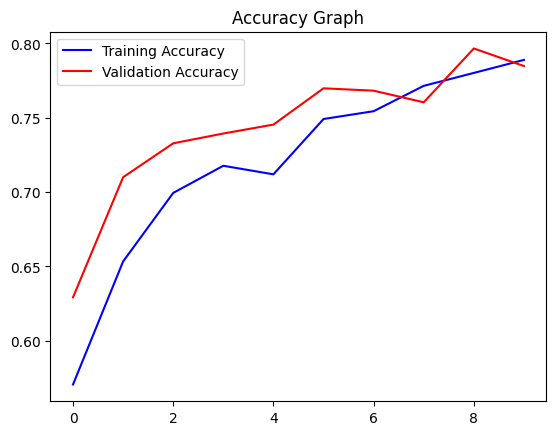

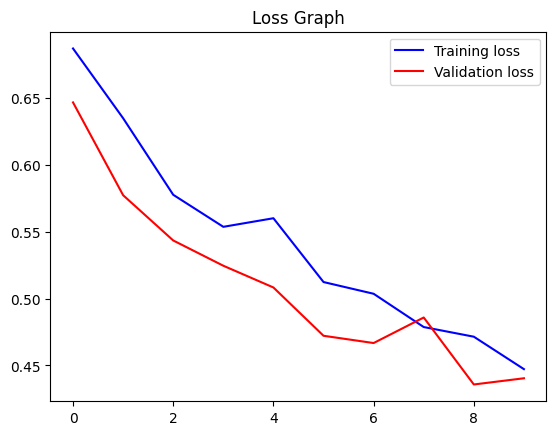

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()


loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs,loss,'b',label='Training loss')
plt.plot(epochs,val_loss,'r',label='Validation loss')
plt.title('Loss Graph')
plt.legend()
plt.show()
